<h1 style="color:blue"> Part (1) </h1>

In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import math
import cv2
from skimage.io import imsave, imread

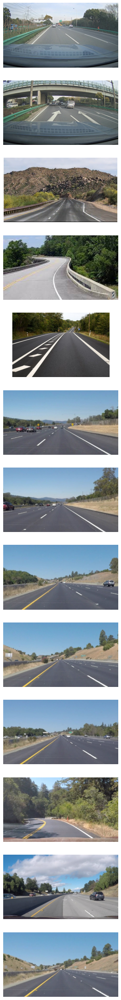

In [2]:
test_images = []
test_titles = []
for filename in os.listdir('./test_images'):
    if "jpg" in filename or "jpeg" in filename:
        test_images.append(plt.imread('./test_images/'+filename))
        test_titles.append(filename)
number_of_images = len(test_images)
fig, axs = plt.subplots(number_of_images, 1)
fig.set_figwidth(40)
fig.set_figheight(40)
for idx, ax in enumerate(axs):
    ax.imshow(test_images[idx])
    ax.axis(False)

In [3]:

def rgb_to_hsi(rgb_pixel):
    red, green, blue = rgb_pixel/256.0
    intensity = min(red, green, blue)
    saturation = 1 - (3*min(red, green, blue)/(red+green+blue + 0.0001))
    denominator = np.sqrt(((red-green)**2 + (red-blue)*(green-blue)))
    denominator = 1 if denominator == 0 else denominator
    theta = math.acos((0.5*(2*red - green- blue))/ denominator)
    hue = theta if blue <= green else 2*math.pi - theta
    return [hue, saturation, intensity]

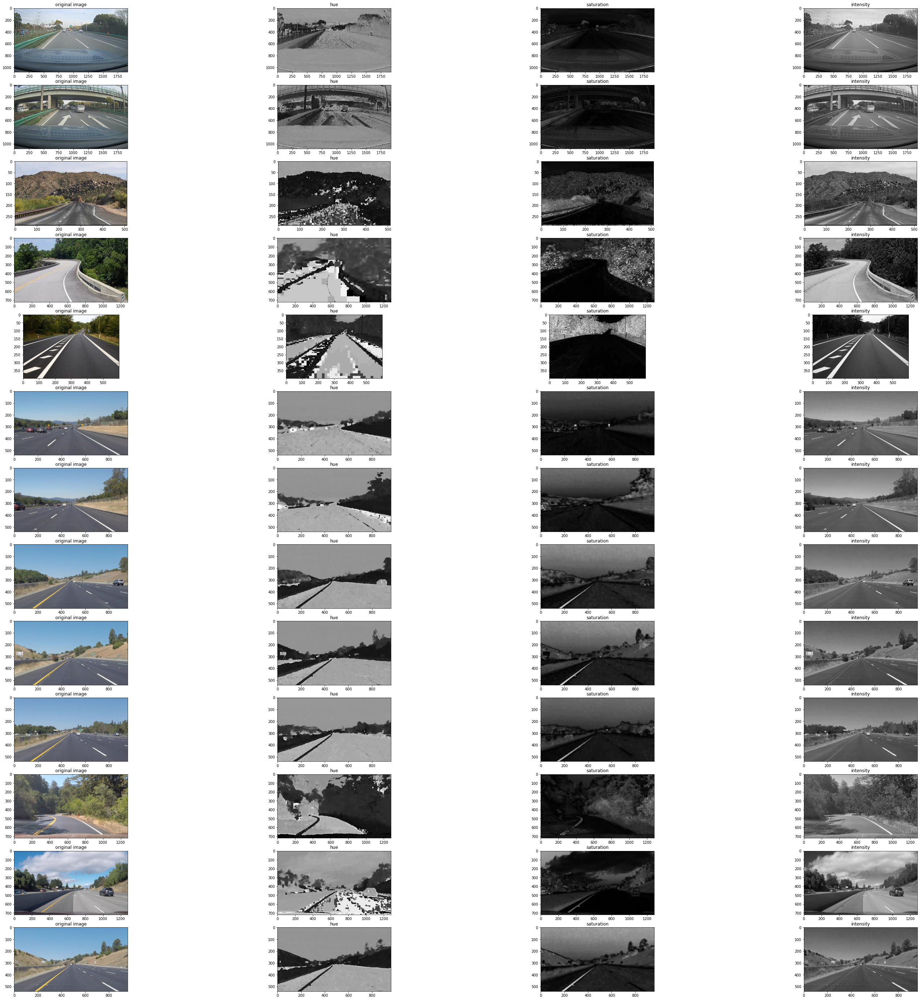

In [4]:
fig, axs = plt.subplots(number_of_images, 4)
fig.set_figheight(50)
fig.set_figwidth(50)
hsi_images = []
for img, ax in zip(test_images, axs):
    ax[0].imshow(img)
    ax[0].set_title("original image")
    hsi_img = np.apply_along_axis(rgb_to_hsi, -1, img)
    hsi_images.append(hsi_img)
    titles = ['hue', 'saturation', 'intensity']
    for i in range(1,4):
        ax[i].imshow(hsi_img[:,:,i-1], cmap='gray')
        ax[i].set_title(titles[i-1])

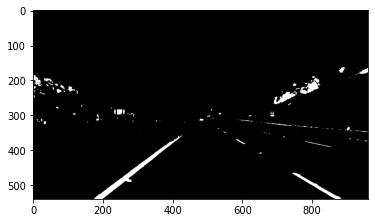

In [7]:
img = hsi_images[-1]
hue = img[:, :, 0]
sat = img[:, :, 1]
intensity = img[:,:,2]

white_lane_mask = np.bitwise_and((sat < white_color_saturation_threshold), (intensity > white_color_intensity_theshold))
yellow_lane_mask = np.bitwise_and((sat > yellow_color_saturation_threshold), (hue < yellow_color_hue_threshold))
mask = np.bitwise_or(white_lane_mask, yellow_lane_mask)
copied = np.copy(img)
copied[mask] = 1.
copied[~mask] = 0.

plt.imshow(copied, cmap='gray')

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/1372194279.py:29: UserWarning: part1_output/00003.jpg is a low contrast image
  imsave("part1_output/"+test_titles[idx],mask_img)
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/1372194279.py:29: UserWarning: part1_output/00096.jpg is a low contrast image
  imsave("part1_output/"+test_titles[idx],mask_img)
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/1372194279.py:29: UserWarning: part1_output/climbing-lane.jpg is a low contrast image
  imsave("part1_output/"+test_titles[idx],mask_img)
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/1372194279.py:29: UserWarning: part1_output/images.

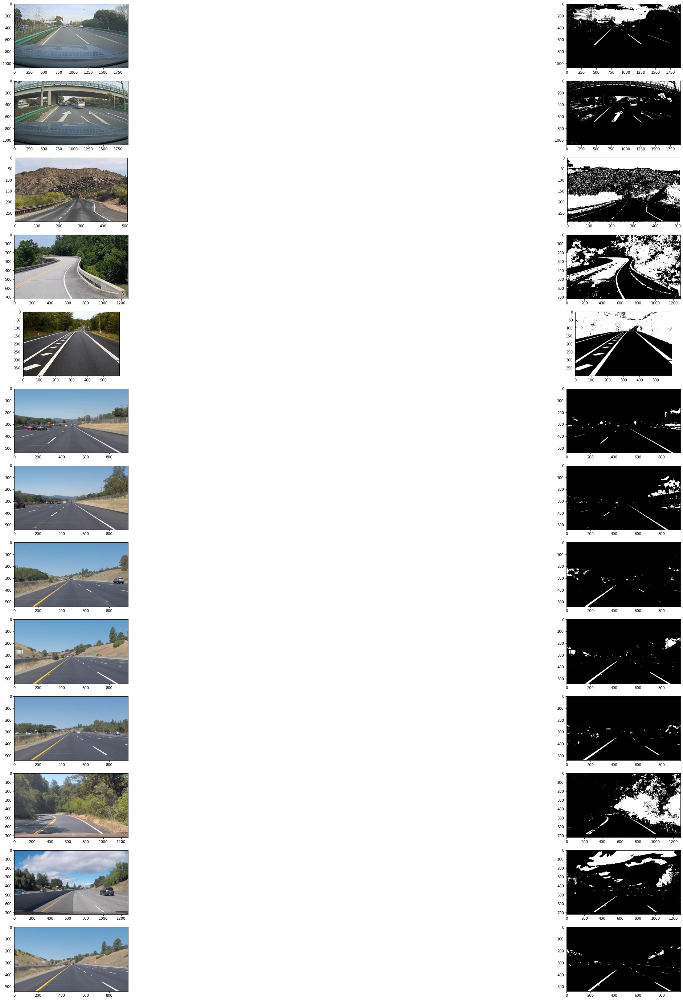

In [6]:

"""
White Lane Lines:
        higher values in intensity channel and low values in saturation channel
Yellow Lane Lines:
        higher values in saturation channel and low values in hue channel
"""

white_color_intensity_theshold = .75
# white_color_saturation_threshold = .05
white_color_saturation_threshold = .07

yellow_color_saturation_threshold = .2 #0.5
yellow_color_hue_threshold = 2
fig, axs = plt.subplots(number_of_images, 2)
fig.set_figheight(50)
fig.set_figwidth(50)
count = 0
for idx, ax in enumerate(axs):
    #hsi = np.apply_along_axis(rgb_to_hsi, -1, img)
    img = hsi_images[idx]
    hue = img[:, :, 0]
    sat = img[:, :, 1]
    intensity = img[:,:,2]
    count = count + 1
    white_lane_mask = np.bitwise_and((sat < white_color_saturation_threshold), (intensity > white_color_intensity_theshold))
    yellow_lane_mask = np.bitwise_and((sat > yellow_color_saturation_threshold), (hue < yellow_color_hue_threshold))
    mask = np.bitwise_or(white_lane_mask, yellow_lane_mask)
    mask_img = np.where(mask == True ,1,0)
    imsave("part1_output/"+test_titles[idx],mask_img)
    copied = np.copy(img)
    copied[mask] = 1.
    copied[~mask] = 0.
    ax[0].imshow(test_images[idx])
    ax[1].imshow(copied, cmap='gray')

<h1 style="color:blue">Part (2) </h1>

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import matplotlib.image as mpimg
import skimage.io as io
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.measure import find_contours
from skimage.draw import rectangle

# Show the figures / plots inside the notebook
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [11]:
def region_of_interest(img, vertices):
    mask = np.zeros_like(img)
    # channel_count = img.shape[2]
    match_mask_color = (255)
    cv2.fillPoly(mask, vertices, match_mask_color)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def draw_lines(img, lines):
    img = np.copy(img)
    blank_image = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)

    for line in lines:
        for x1, y1, x2, y2 in line:
            if(abs(y1-y2)>40): # np.sqrt(np.sum([np.square(y2-y1),np.square(x2-x1)])) #Euclidean distance
                cv2.line(blank_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

    img = cv2.addWeighted(img, 0.8, blank_image, 1, 0.0)
    return img

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def threshold(img):
    image=rgb2gray(img)
    global_thresh = threshold_otsu(image)
    binary_global = image > global_thresh
    return binary_global

def sobel_H_V_angles(img):
    # gray_img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_BGR2GRAY)
    blur_img = gaussian_blur(img, 9)
    sobelx = cv2.Sobel(src=blur_img, ddepth=cv2.CV_64F, dx=1, dy=0) # Sobel on the X axis
    sobelx = abs(sobelx) + 1
    sobely = cv2.Sobel(src=blur_img, ddepth=cv2.CV_64F, dx=0, dy=1) # Sobel on the Y axis
    sobely = abs(sobely) + 1
    angles = abs(sobely/sobelx) #np.arctan
    return sobelx, sobely, angles

00003.jpg


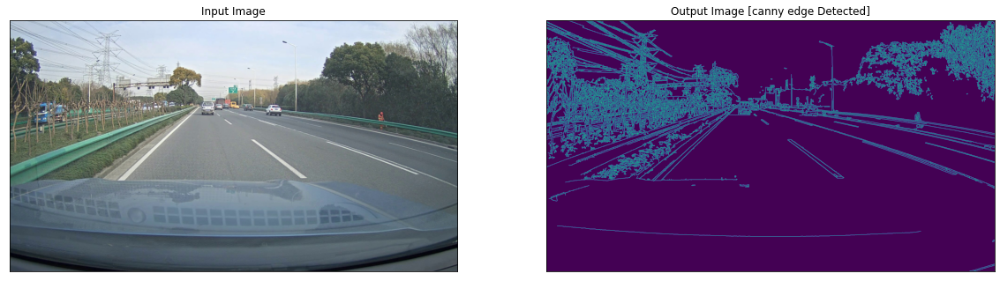

00096.jpg


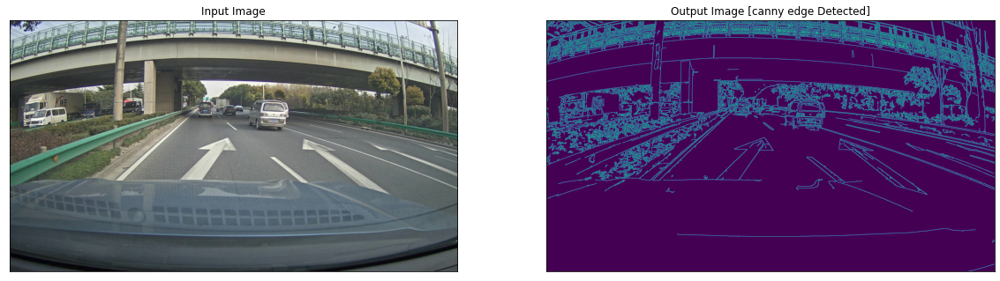

climbing-lane.jpg


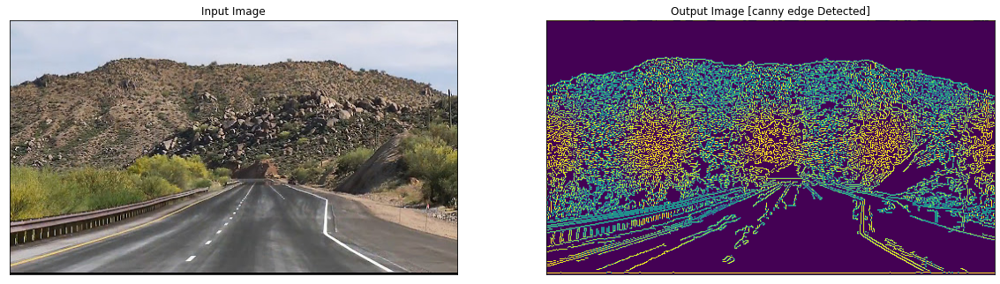

images.jfif


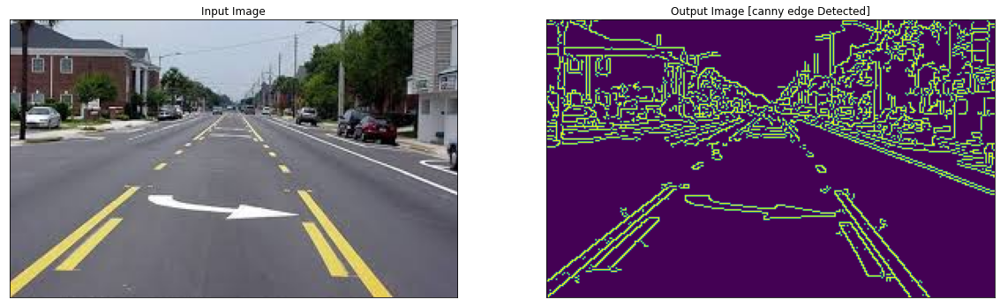

images.jpg


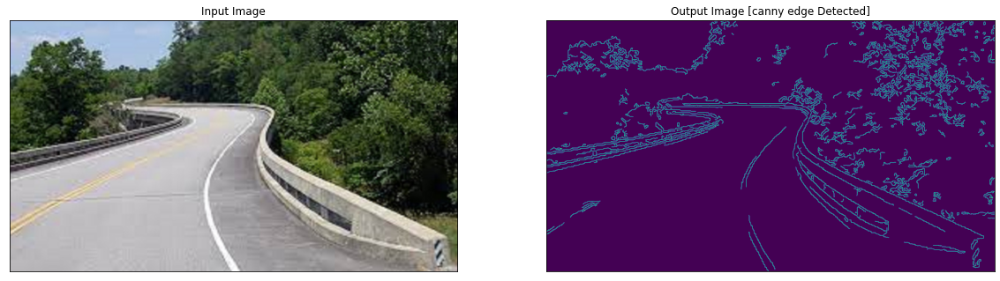

road2.jfif


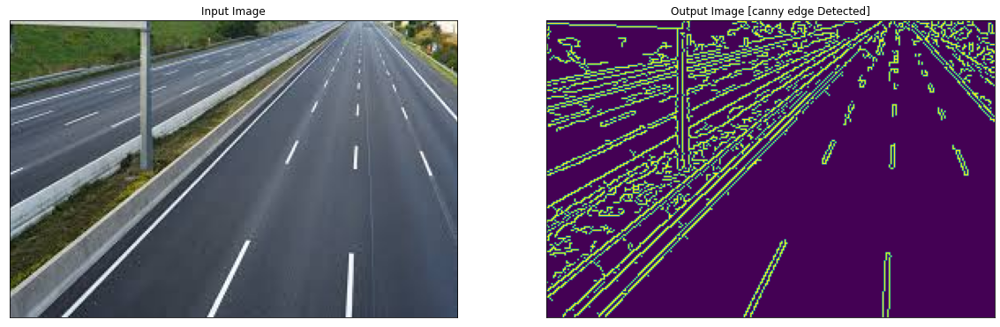

road4.jfif


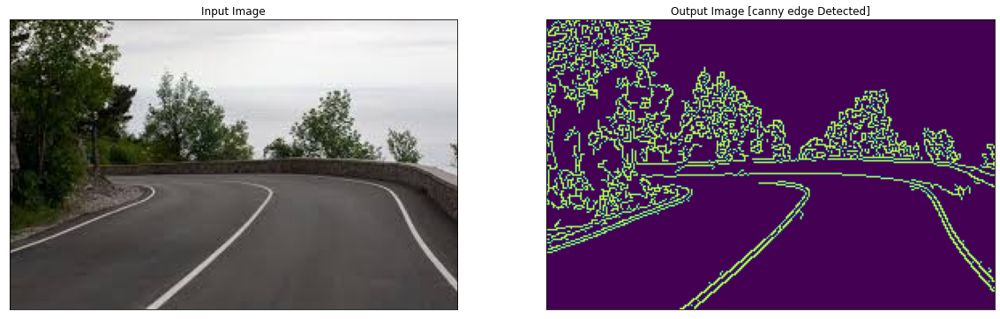

road5.jfif


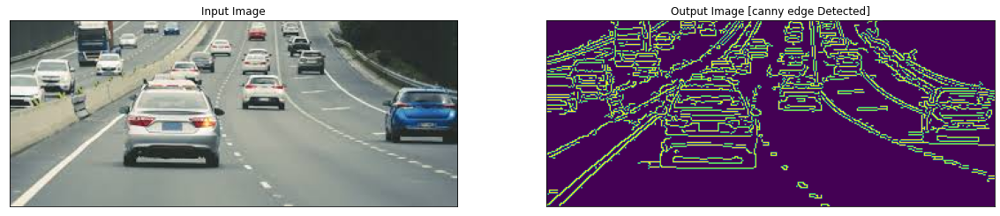

road6.jpeg


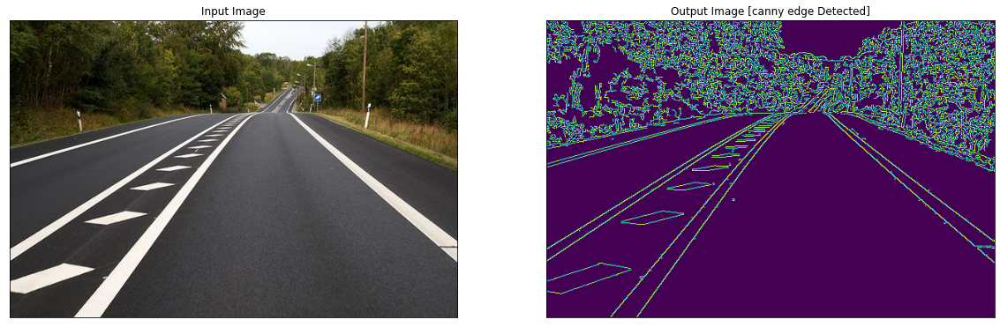

solidWhiteCurve.jpg


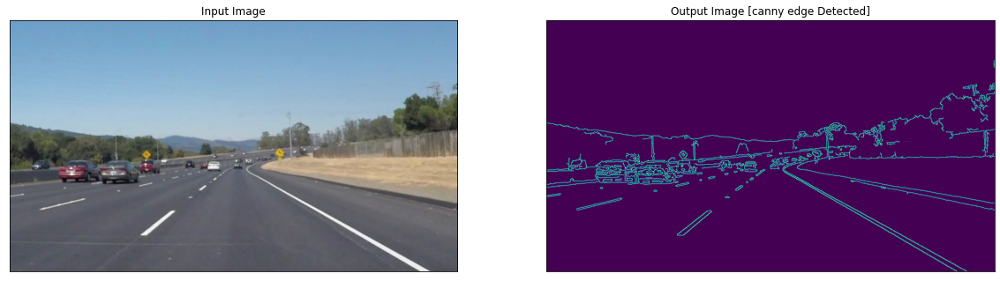

solidWhiteRight.jpg


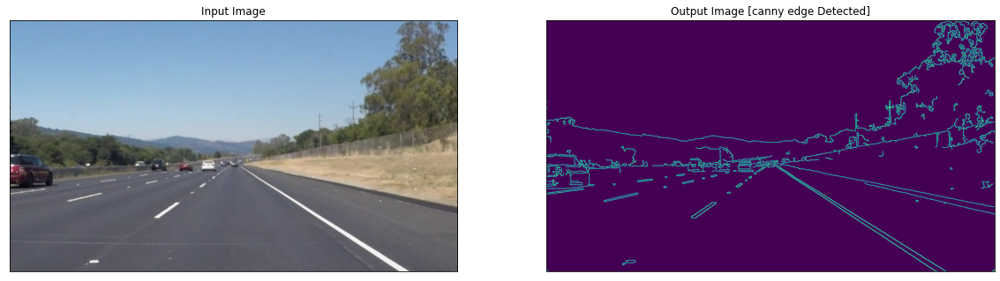

solidYellowCurve.jpg


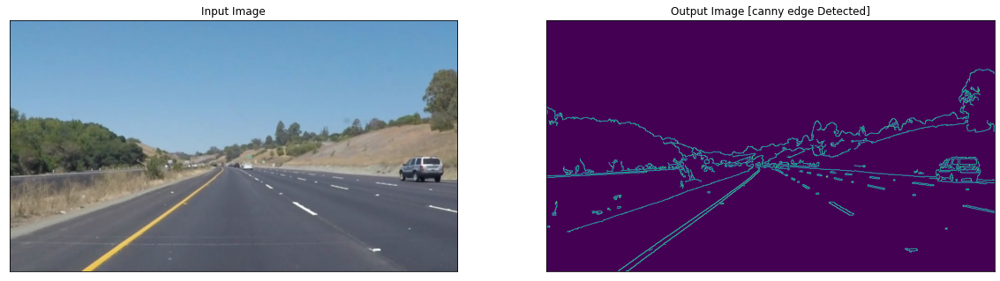

solidYellowCurve2.jpg


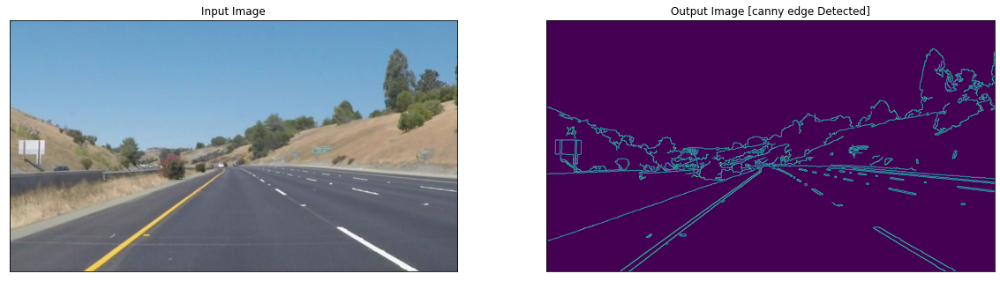

solidYellowLeft.jpg


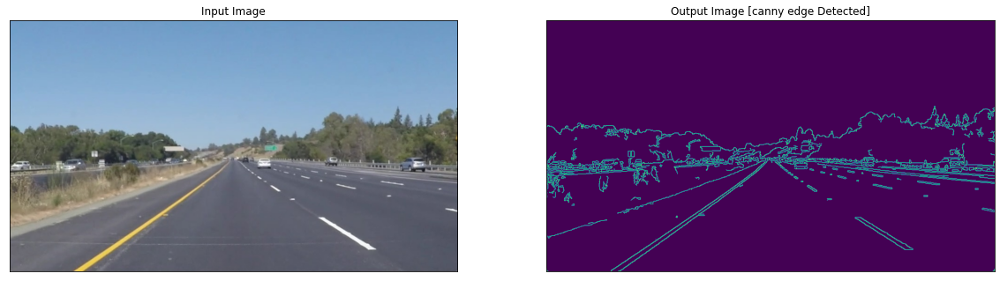

test10.jpg


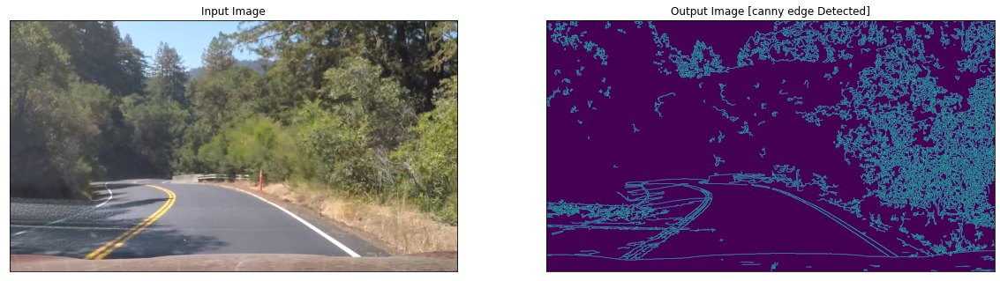

test5.jpg


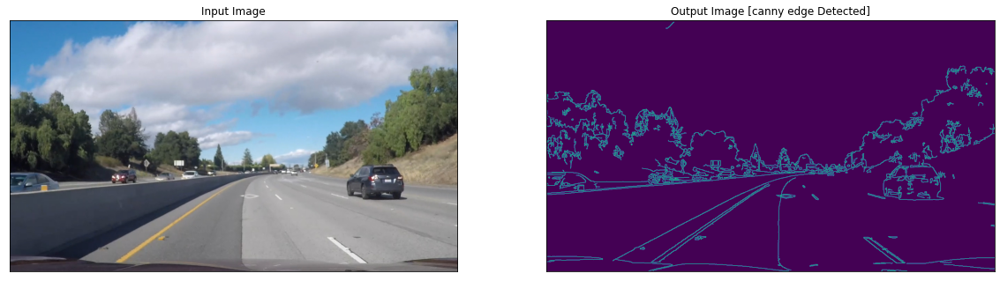

whiteCarLaneSwitch.jpg


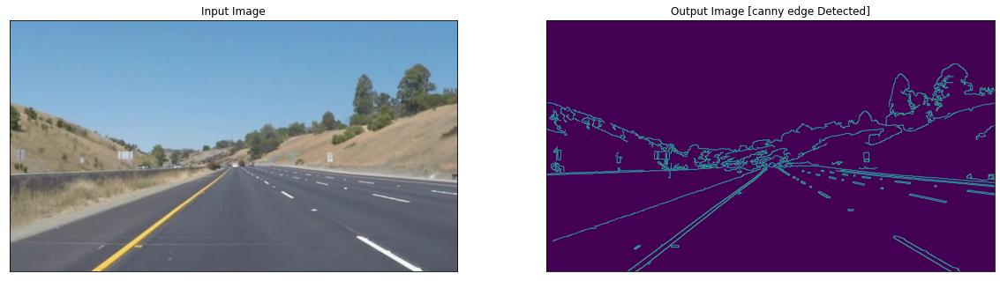

In [12]:

for image_path in list(os.listdir('./test_images')):
    print(image_path)
    fig = plt.figure(figsize=(20, 10))
    image = mpimg.imread(f'./test_images/{image_path}')
    ax = fig.add_subplot(1, 2, 1,xticks=[], yticks=[])
    plt.imshow(image)
    ax.set_title("Input Image")
    ax = fig.add_subplot(1, 2, 2,xticks=[], yticks=[])
    plt.imshow(cv2.Canny(image, 50, 200))
    ax.set_title("Output Image [canny edge Detected]")
    plt.show()

In [13]:
def textur_filtring_with_angles(image, edged_img, window_height, window_width, textur_threshold):
    result = np.copy(edged_img)
    half_height = window_height//2 # Y
    half_width = window_width//2 # X
    sobelx, sobely, angles = sobel_H_V_angles(image)
    for i in range(half_height, result.shape[0] - half_height - 10):
        for j in range(half_width, result.shape[1] - half_width):
            # mean = np.average(angles[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)])
            # var = np.average((angles[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)] - mean)**2)
            # this approach uses to minimuize time and calculations 
            min_angle = np.min(angles[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)])
            max_angle = np.max(angles[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)])
            if(max_angle - min_angle > textur_threshold):
                result[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)] = 0
    return result

def textur_filtring_with_magnitude(image, edged_img, window_height, window_width, textur_threshold):
    result = np.copy(edged_img)
    half_height = window_height//2 # Y
    half_width = window_width//2 # X
    for i in range(half_height, result.shape[0] - half_height - 10):
        for j in range(half_width, result.shape[1] - half_width):
            if(np.sum(edged_img[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)] > 0) > textur_threshold):
                result[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)] = 0
    return result


00003.jpg
255
filtered_image_sum  46649
threshold  0.022496624228395063


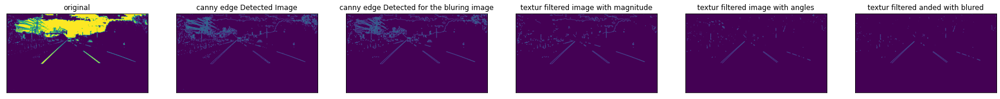

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/00003.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


00096.jpg
255
filtered_image_sum  62240
threshold  0.03001543209876543


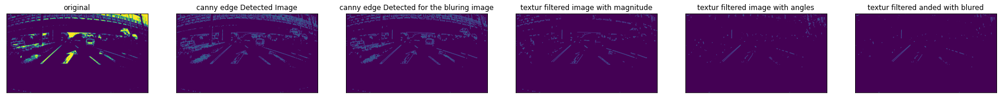

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/00096.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


climbing-lane.jpg
255
filtered_image_sum  25528
threshold  0.171338058419244


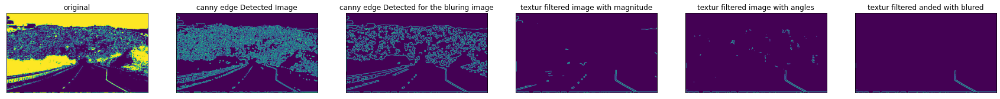

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/climbing-lane.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


images.jpg
255
filtered_image_sum  51898
threshold  0.056312934027777775


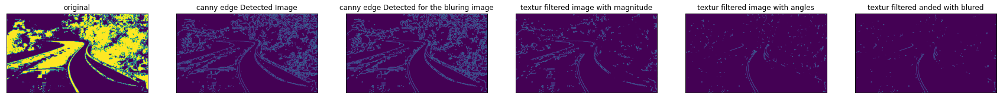

road6.jpeg
255
filtered_image_sum  9894
threshold  0.04132832080200501


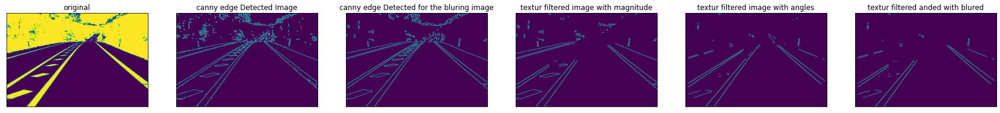

solidWhiteCurve.jpg
255
filtered_image_sum  4423
threshold  0.008532021604938272


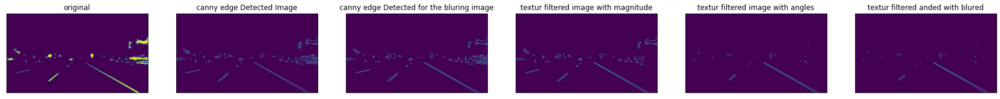

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/solidWhiteCurve.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


solidWhiteRight.jpg
255
filtered_image_sum  6198
threshold  0.011956018518518519


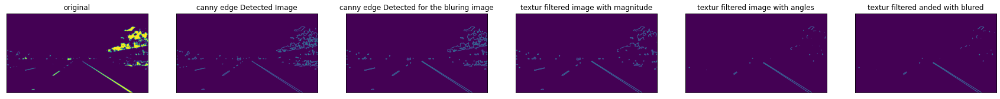

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/solidWhiteRight.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


solidYellowCurve.jpg
255
filtered_image_sum  3590
threshold  0.006925154320987654


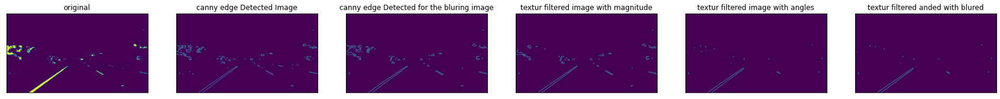

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/solidYellowCurve.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


solidYellowCurve2.jpg
255
filtered_image_sum  4495
threshold  0.00867091049382716


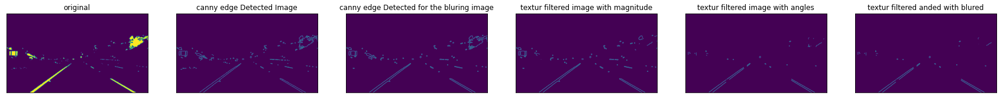

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/solidYellowCurve2.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


solidYellowLeft.jpg
255
filtered_image_sum  3895
threshold  0.007513503086419753


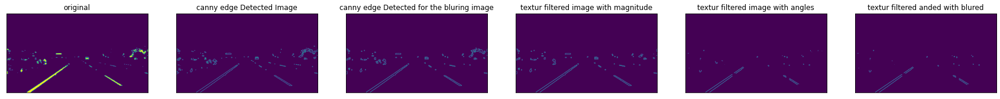

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/solidYellowLeft.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


test10.jpg
255
filtered_image_sum  37569
threshold  0.04076497395833333


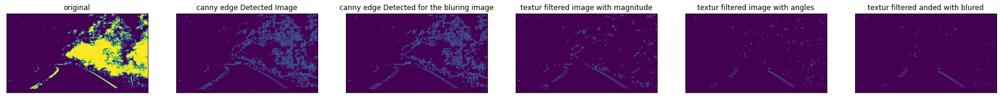

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/test10.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


test5.jpg
255
filtered_image_sum  16449
threshold  0.017848307291666667


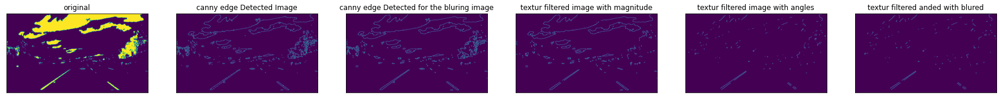

whiteCarLaneSwitch.jpg
255
filtered_image_sum  4077
threshold  0.007864583333333333


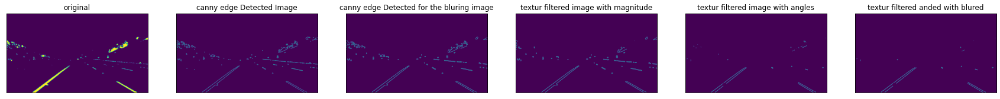

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/2900404878.py:52: UserWarning: part2_output/whiteCarLaneSwitch.jpg is a low contrast image
  imsave("part2_output/"+image_path,filtered_image_with_magnitude)


In [29]:
from skimage.filters import gaussian
from skimage.io import imsave, imread
count = 0
for image_path in list(os.listdir('./part1_output')):
    count = count + 1
    fig = plt.figure(figsize=(30, 10))
    image = mpimg.imread(f'./part1_output/{image_path}')
    print(image_path)
    ax = fig.add_subplot(1, 6, 1,xticks=[], yticks=[])
    plt.imshow(image)
    ax.set_title("original")
    edge = cv2.Canny(image, 50, 200, apertureSize=3)
    ax = fig.add_subplot(1, 6, 2,xticks=[], yticks=[])
    plt.imshow(edge)
    ax.set_title("canny edge Detected Image")
    ########################################################################
    blur_img = gaussian_blur(image, 9)
    blur_edged = cv2.Canny(blur_img, 100, 200, apertureSize=3)
    ax = fig.add_subplot(1, 6, 3,xticks=[], yticks=[])
    plt.imshow(blur_edged)
    ax.set_title("canny edge Detected for the bluring image")
    ########################################################################
    ax = fig.add_subplot(1, 6, 4,xticks=[], yticks=[])
    filtered_image_with_magnitude = textur_filtring_with_magnitude(image, blur_edged, 20, 40, 130) #try 200 or 150
    plt.imshow(filtered_image_with_magnitude)
    ax.set_title("textur filtered image with magnitude")
    ################################ Weighted sum  ########################
    print(edge.max())
    filtered_image_edge_sum = np.sum(edge//255)
    print("filtered_image_sum ",filtered_image_edge_sum)
    threshold = (filtered_image_edge_sum/(image.shape[0]*image.shape[1]))
    print("threshold ",threshold)
    ########################################################################
    
    ax = fig.add_subplot(1, 6, 5,xticks=[], yticks=[])
    filtered_image_with_angles = textur_filtring_with_angles(image, blur_edged, 10, 10, 40) #try 200 or 150
    plt.imshow(filtered_image_with_angles)
    ax.set_title("textur filtered image with angles")
    ########################################################################
    ax = fig.add_subplot(1, 6, 6,xticks=[], yticks=[])
    filter_and_blur = filtered_image_with_magnitude & filtered_image_with_angles 
    plt.imshow(filter_and_blur)
    ax.set_title("textur filtered anded with blured")
    plt.show()

    imsave("part2_output/"+image_path,filtered_image_with_magnitude)
    

In [30]:
def weighted_img(img, initial_img, α=0.1, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    lines_edges = cv2.addWeighted(initial_img, α, img, β, γ)
    return lines_edges

In [31]:
def slope_lines(image,lines):
    
    img = image.copy()
    poly_vertices = []
    order = [0,1,3,2]

    left_lines = [] # Like /
    right_lines = [] # Like \
    for line in lines:
        for x1,y1,x2,y2 in line:

            if x1 == x2:
                pass #Vertical Lines
            else:
                m = (y2 - y1) / (x2 - x1)
                c = y1 - m * x1

                if m < 0:
                    left_lines.append((m,c))
                elif m >= 0:
                    right_lines.append((m,c))

    left_line = np.mean(left_lines, axis=0)
    right_line = np.mean(right_lines, axis=0)

    for slope, intercept in [left_line, right_line]:

        #getting complete height of image in y1
        rows, cols = image.shape[:2]
        y1= int(rows) #image.shape[0]

        #taking y2 upto 60% of actual height or 60% of y1
        y2= int(rows*0.6) #int(0.6*y1)

        #we know that equation of line is y=mx +c so we can write it x=(y-c)/m
        x1=int((y1-intercept)/slope)
        x2=int((y2-intercept)/slope)
        poly_vertices.append((x1, y1))
        poly_vertices.append((x2, y2))
        draw_lines(img, np.array([[[x1,y1,x2,y2]]]))
    
    poly_vertices = [poly_vertices[i] for i in order]
    cv2.fillPoly(img, pts = np.array([poly_vertices],'int32'), color = (0,255,0))
    return cv2.addWeighted(image,0.7,img,0.4,0.)

In [32]:
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    line_img = slope_lines(line_img,lines)
    return line_img


In [33]:
def draw_lines(img, lines):
    img = np.copy(img)
    blank_image = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)

    for line in lines:
        for x1, y1, x2, y2 in line:
            if(abs(y2-y1) > 20):
               cv2.line(blank_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    img = cv2.addWeighted(img, 0.8, blank_image, 1, 0.0)
    return img


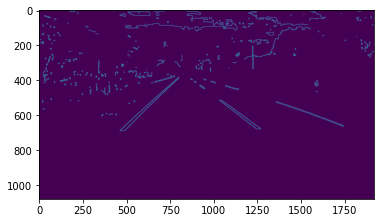

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/3144437901.py:14: UserWarning: after_Crop_output/00003.jpg is a low contrast image
  imsave("after_Crop_output/"+ image_path,combined)


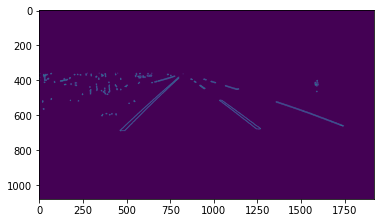

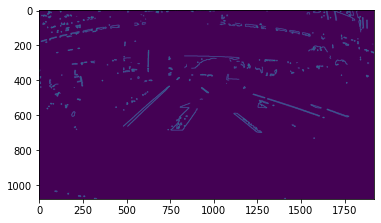

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/3144437901.py:14: UserWarning: after_Crop_output/00096.jpg is a low contrast image
  imsave("after_Crop_output/"+ image_path,combined)


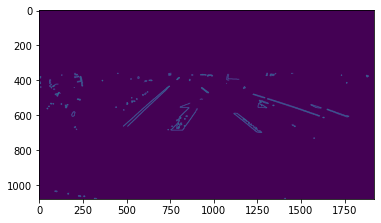

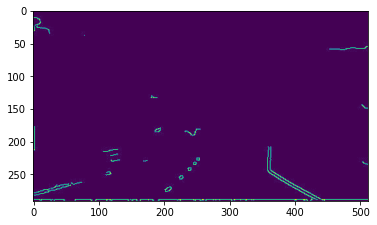

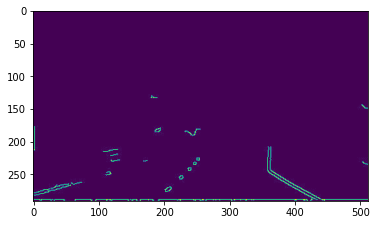

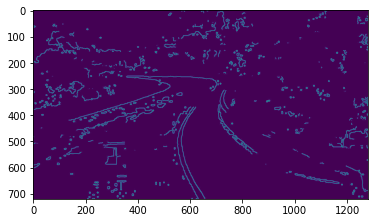

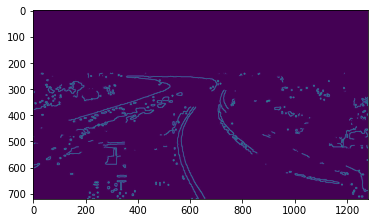

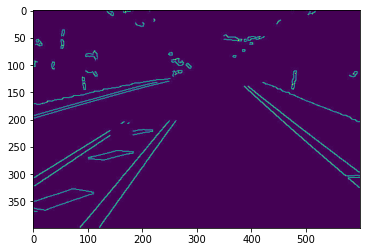

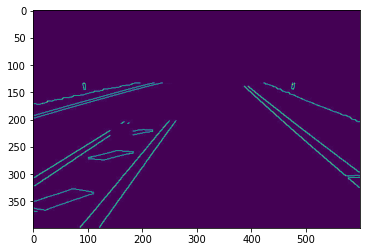

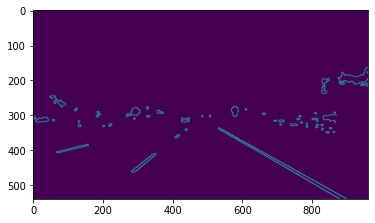

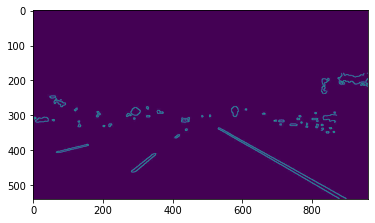

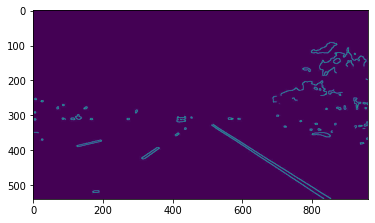

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/3144437901.py:14: UserWarning: after_Crop_output/solidWhiteRight.jpg is a low contrast image
  imsave("after_Crop_output/"+ image_path,combined)


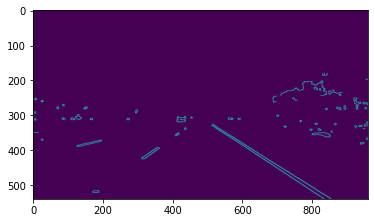

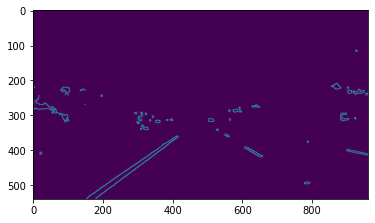

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/3144437901.py:14: UserWarning: after_Crop_output/solidYellowCurve.jpg is a low contrast image
  imsave("after_Crop_output/"+ image_path,combined)


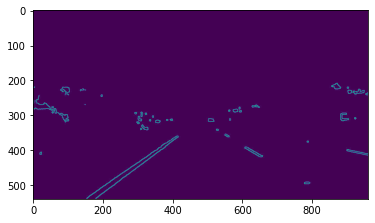

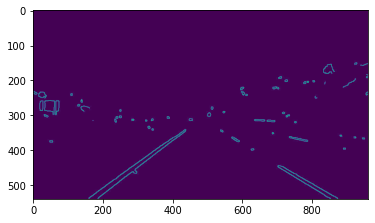

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/3144437901.py:14: UserWarning: after_Crop_output/solidYellowCurve2.jpg is a low contrast image
  imsave("after_Crop_output/"+ image_path,combined)


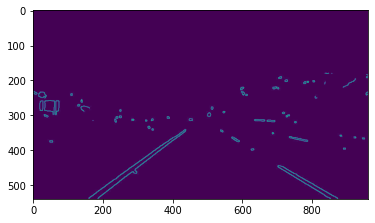

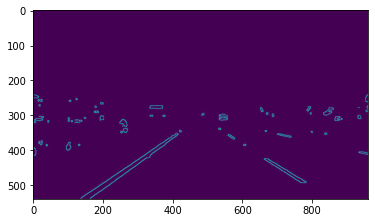

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/3144437901.py:14: UserWarning: after_Crop_output/solidYellowLeft.jpg is a low contrast image
  imsave("after_Crop_output/"+ image_path,combined)


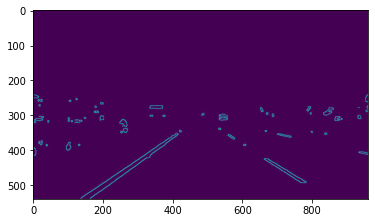

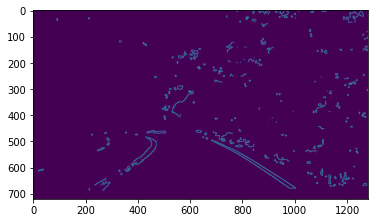

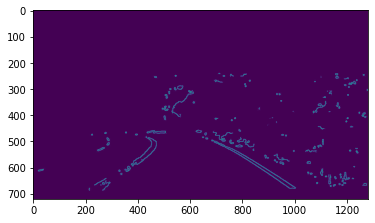

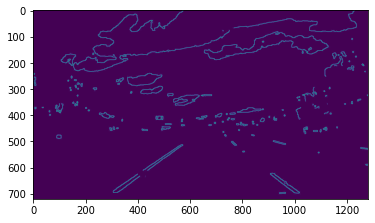

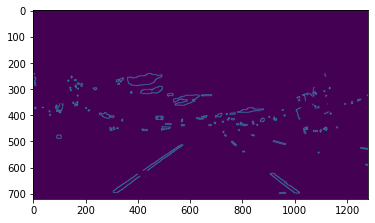

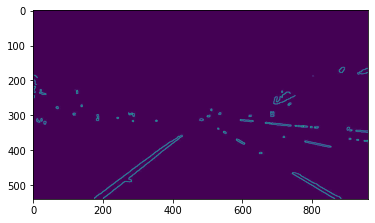

C:\Users\Menna\AppData\Local\Temp/ipykernel_14160/3144437901.py:14: UserWarning: after_Crop_output/whiteCarLaneSwitch.jpg is a low contrast image
  imsave("after_Crop_output/"+ image_path,combined)


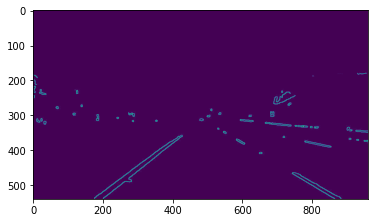

In [34]:
for image_path in list(os.listdir('./part2_output')):
    original = mpimg.imread(f'./part2_output/{image_path}')
    
    image = np.copy(original)
    plt.imshow(original)
    plt.show()

    image_cropped_lower = image[int(image.shape[0]/3):]

    image[:int(image.shape[0]/3)] = 0
    image_cropped_upper = image[:int(image.shape[0]/3)]

    combined = np.block([[image_cropped_upper],[image_cropped_lower]])
    imsave("after_Crop_output/"+ image_path,combined)
    plt.imshow(combined)
    plt.show()

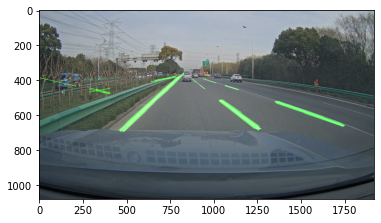

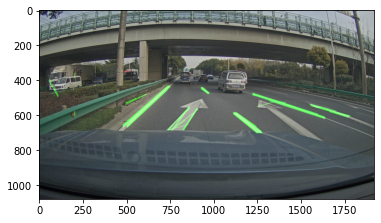

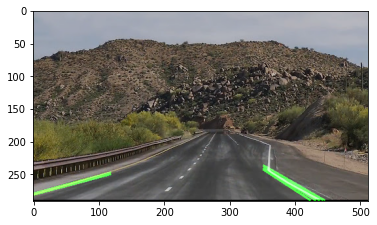

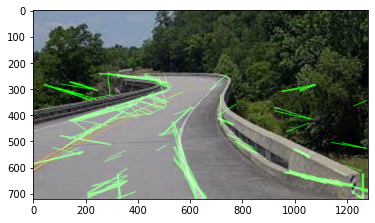

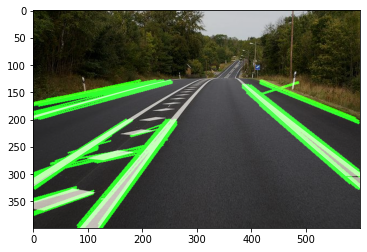

...

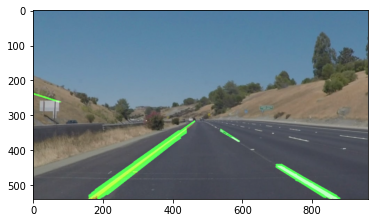

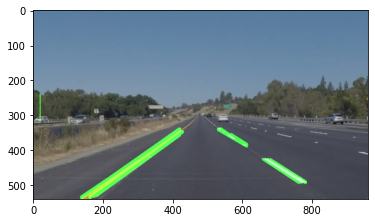

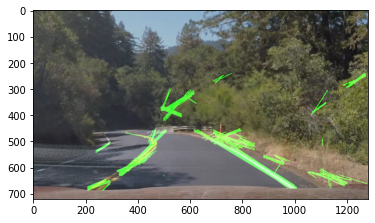

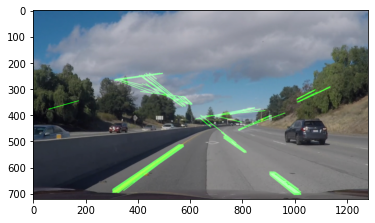

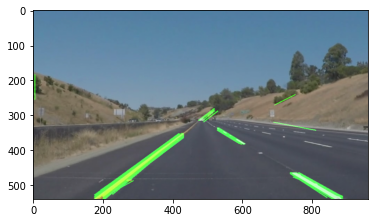

In [35]:
for image_path in list(os.listdir('./after_Crop_output')):
        combined = mpimg.imread(f'./after_Crop_output/{image_path}')
        original = mpimg.imread(f'./test_images/{image_path}')
        output = np.copy(original)
        # houghed_lines = hough_lines(img = filter_and_blur, rho = 1, theta = np.pi/180, threshold = 20, min_line_len = 20, max_line_gap = 180)
        houghed_lines = cv2.HoughLinesP(combined, rho=2, theta=np.pi/180,
                            threshold=120, lines=np.array([]), minLineLength=10, maxLineGap=30)
        output = draw_lines(original, houghed_lines)
        # #Draw lines on edges
        # output = weighted_img(img = houghed_lines, initial_img = image, α=0.8, β=1., γ=0.)
        plt.imshow(output)
        plt.show()